[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1Q6ZG5HAhkR5krezEsCgtAppFwmcMI2o4?usp=sharing)

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_hub as hub

In [2]:
dataset, info = tfds.load('cassava', with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/5656 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cassava/incomplete.3CP6C3_0.1.0/cassava-train.tfrecord*...:   0%|         …

Generating test examples...:   0%|          | 0/1885 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cassava/incomplete.3CP6C3_0.1.0/cassava-test.tfrecord*...:   0%|          …

Generating validation examples...:   0%|          | 0/1889 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cassava/incomplete.3CP6C3_0.1.0/cassava-validation.tfrecord*...:   0%|    …

Dataset cassava downloaded and prepared to /root/tensorflow_datasets/cassava/0.1.0. Subsequent calls will reuse this data.


In [3]:
info

tfds.core.DatasetInfo(
    name='cassava',
    full_name='cassava/0.1.0',
    description="""
    Cassava consists of leaf images for the cassava plant depicting healthy and
    four (4) disease conditions; Cassava Mosaic Disease (CMD), Cassava Bacterial
    Blight (CBB), Cassava Greem Mite (CGM) and Cassava Brown Streak Disease (CBSD).
    Dataset consists of a total of 9430 labelled images.
    The 9430 labelled images are split into a training set (5656), a test set(1885)
    and a validation set (1889). The number of images per class are unbalanced with
    the two disease classes CMD and CBSD having 72% of the images.
    """,
    homepage='https://www.kaggle.com/c/cassava-disease/overview',
    data_dir=PosixGPath('/tmp/tmppmzo1jwrtfds'),
    file_format=tfrecord,
    download_size=1.26 GiB,
    dataset_size=1.26 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': Cla

In [4]:
# Extend the cassava dataset classes with 'unknown'
class_names = info.features['label'].names + ['unknown']

# Map the class names to human readable names
name_map = dict(
    cmd='Mosaic Disease',
    cbb='Bacterial Blight',
    cgm='Green Mite',
    cbsd='Brown Streak Disease',
    healthy='Healthy',
    unknown='Unknown')

print(len(class_names), 'classes:')
print(class_names)
print([name_map[name] for name in class_names])

6 classes:
['cbb', 'cbsd', 'cgm', 'cmd', 'healthy', 'unknown']
['Bacterial Blight', 'Brown Streak Disease', 'Green Mite', 'Mosaic Disease', 'Healthy', 'Unknown']


In [5]:
def preprocess_fn(data):
  image = data['image']

  # Normalize [0, 255] to [0, 1]
  image = tf.cast(image, tf.float32)
  image = image / 255.

  # Resize the images to 224 x 224
  image = tf.image.resize(image, (224, 224))

  data['image'] = image
  return data

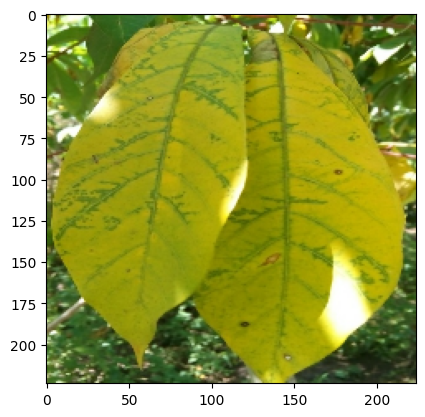

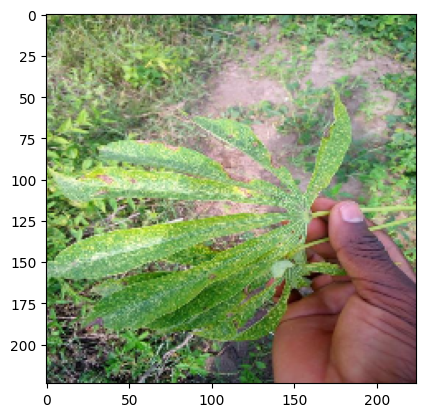

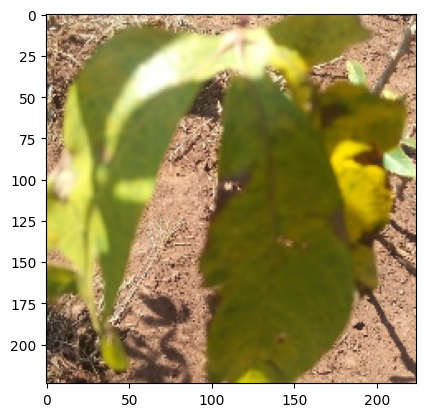

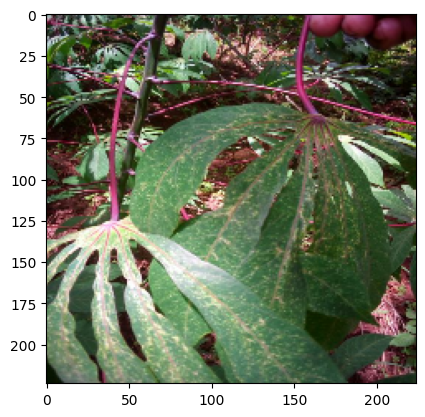

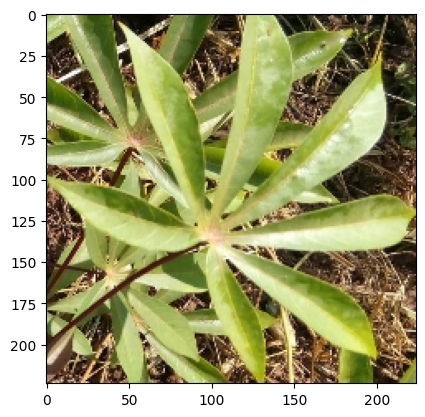

...

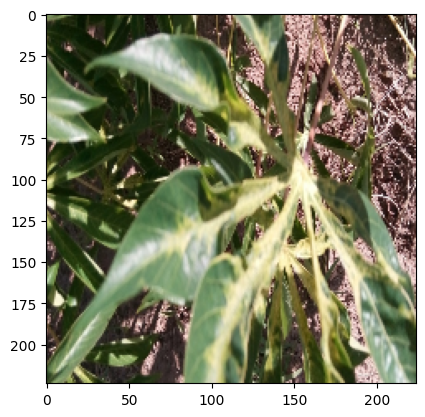

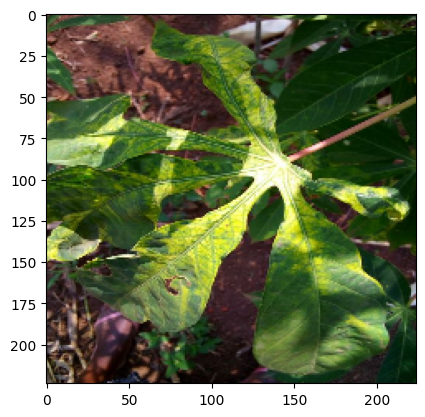

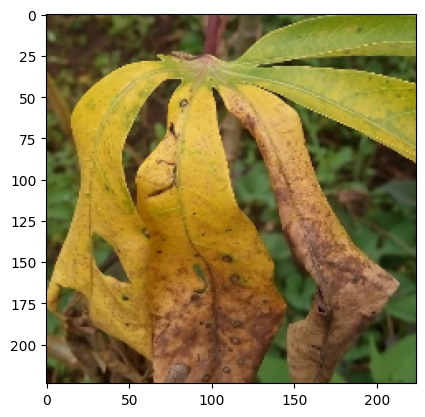

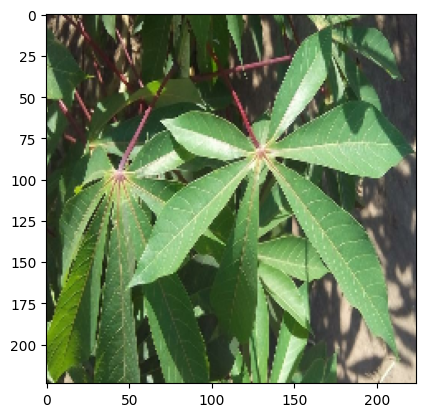

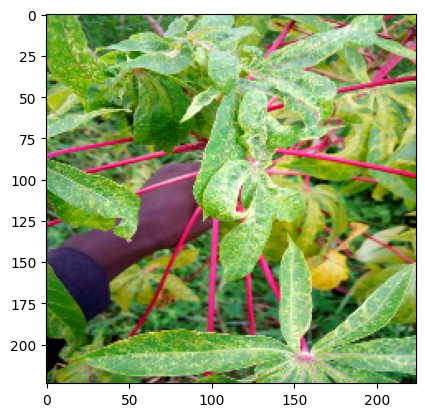

In [9]:
batch = dataset['validation'].map(preprocess_fn).batch(25).as_numpy_iterator()
examples = next(batch)
for i in range(len(examples['image'])):
  plt.imshow(examples['image'][i])
  plt.show()

In [10]:
classifier = hub.KerasLayer('https://tfhub.dev/google/cropnet/classifier/cassava_disease_V1/2')
probabilities = classifier(examples['image'])
predictions = tf.argmax(probabilities, axis=-1)

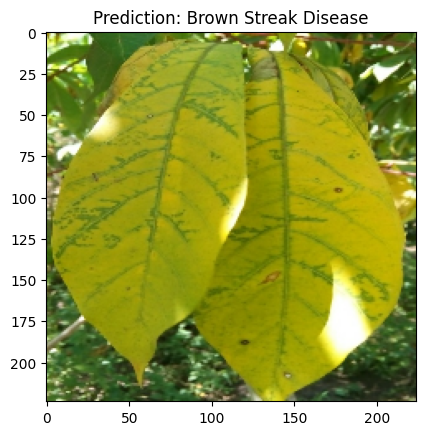

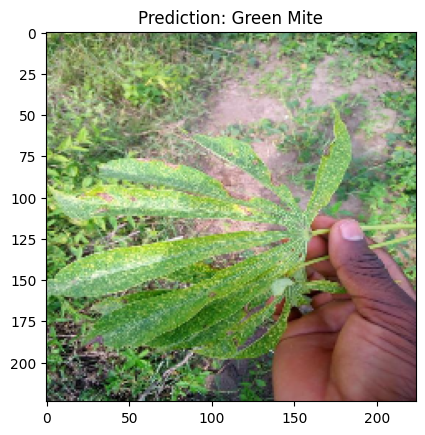

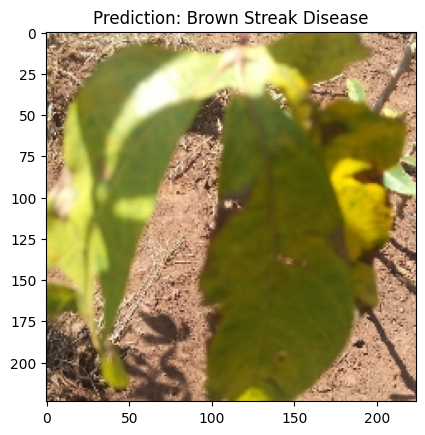

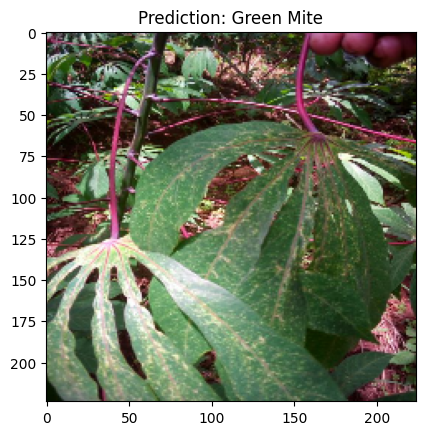

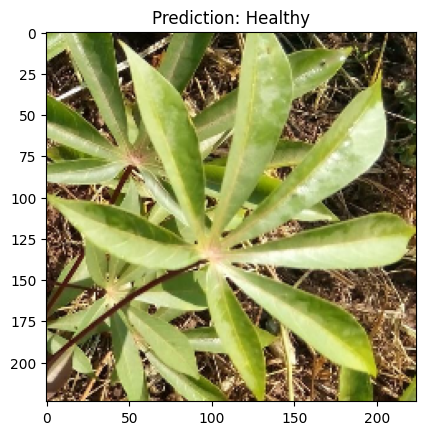

...

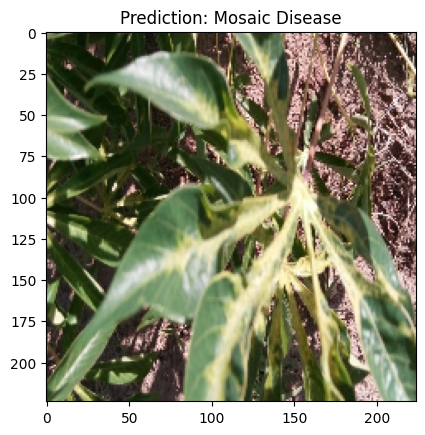

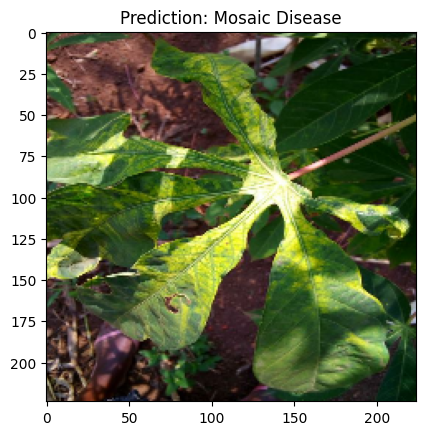

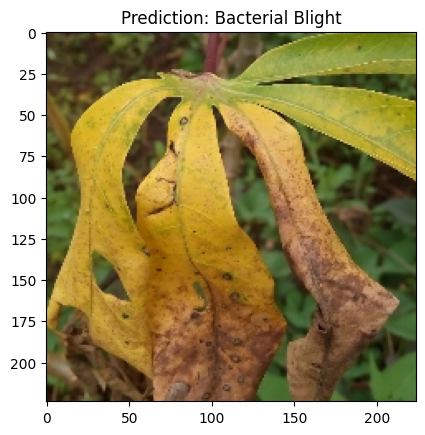

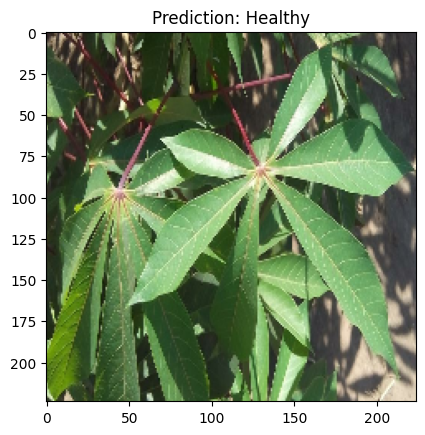

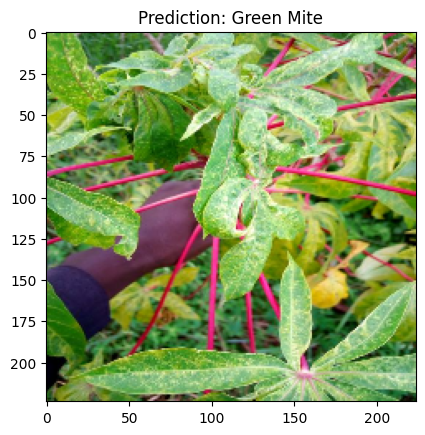

In [12]:
def plot(examples, predictions): # Define the plot function
  """
  Displays the images and their corresponding predictions.

  Args:
    examples: A batch of examples containing images and labels.
    predictions: Predicted class indices for the images.
  """

  for i in range(len(examples['image'])):
    plt.figure()  # Create a new figure for each image
    plt.imshow(examples['image'][i])
    predicted_class = class_names[predictions[i]]  # Get predicted class name
    plt.title(f'Prediction: {name_map[predicted_class]}')  # Set title with human-readable name
    plt.show()

plot(examples, predictions)

In [13]:
def label_to_unknown_fn(data):
  data['label'] = 5  # Override label to unknown.
  return data

In [22]:
remedies = dict(
    cmd='Use virus-free planting material and resistant varieties. Apply appropriate insecticides to control the whitefly population.',
    cbb='Apply copper-based bactericides and ensure good field sanitation. Remove and destroy affected plants.',
    cgm='Use resistant varieties and apply appropriate acaricides to control mite populations.',
    cbsd='Use disease-free planting materials and resistant varieties. Remove and destroy infected plants immediately.',
    healthy='No action needed. Keep up with regular plant care and monitoring.',
    unknown='Consult an expert for further diagnosis and management.'
)

Saving Daun-Singkong-Yang-Terkena-Penyakit-Hawar.jpg to Daun-Singkong-Yang-Terkena-Penyakit-Hawar (3).jpg


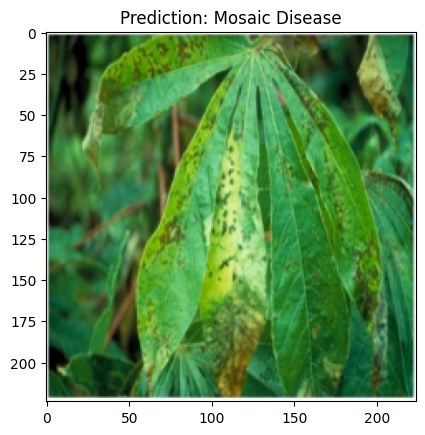

Solve: Use virus-free planting material and resistant varieties. Apply appropriate insecticides to control the whitefly population.


In [29]:
# Upload image
uploaded = files.upload()

# Get the uploaded file name
filename = next(iter(uploaded))

# Load the image
img = cv2.imread(filename)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Preprocess the image
img = cv2.resize(img, (224, 224))
img = tf.convert_to_tensor(img, dtype=tf.float32)
img = img / 255.0
img = tf.expand_dims(img, axis=0)

# Predict
probabilities = classifier(img)
prediction = tf.argmax(probabilities, axis=-1)

# Get predicted class and remedy
predicted_class = class_names[prediction[0]]
predicted_disease = name_map[predicted_class]
remedy = remedies[predicted_class]

# Display the image
plt.imshow(img[0])
plt.title(f'Prediction: {predicted_disease}')
plt.show()

print(f'Solve: {remedy}')